**Advanced Lane Finding Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

**Load chessboard images and Calculate objpoint and imgpoint**

In [2]:
chessboard_image_paths = glob.glob('../camera_cal/calibration*.jpg')

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    """
    A function that takes an image, object points, and image points
    performs the camera calibration, image distortion correction and 
    returns the undistorted image
    """
    ret, mtx, dist, rve, tve = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# prepare object points
nx = 9
ny = 6

objpoint = np.zeros((nx*ny, 3), np.float32)
objpoint[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Colloect objpoints and imgpoints from all given chessboard images
objpoints = []
imgpoints = []

for fname in chessboard_image_paths:
    img = cv2.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
       
    if ret is True:
        objpoints.append(objpoint)
        imgpoints.append(corners)

# Undistort all chessboard images

# for fname in chessboard_image_paths:
#     img = cv2.imread(fname)
#     undistorted = cal_undistort(img, objpoints, imgpoints)
#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     f.tight_layout()
#     ax1.imshow(img)
#     ax1.set_title('Original Image', fontsize=50)
#     ax2.imshow(undistorted)
#     ax2.set_title('Undistorted Image', fontsize=50)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

** Undistort test images **

In [4]:
test_image_paths = []

test_image_paths.extend(glob.glob('../test_images/straight_lines*.jpg'))
test_image_paths.extend(glob.glob('../test_images/test*.jpg'))

straight_lines1


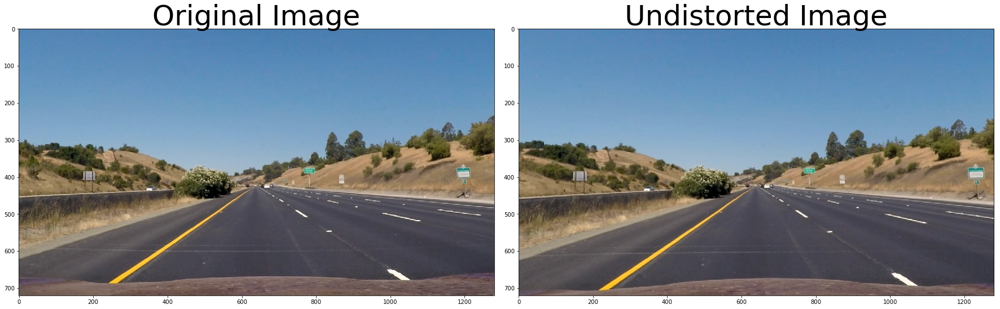

straight_lines2


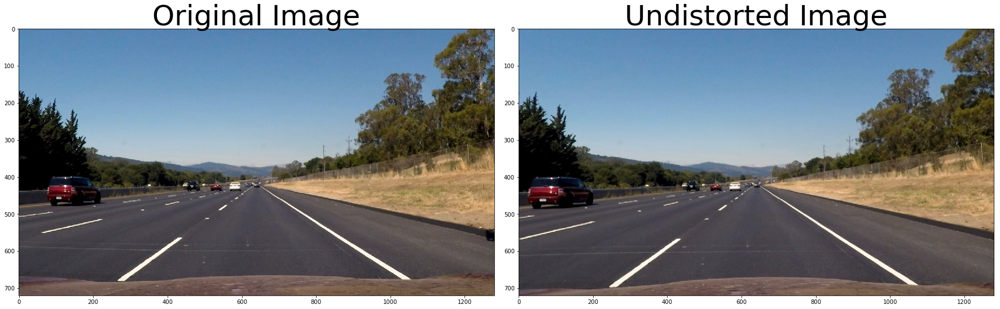

test1


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


test2


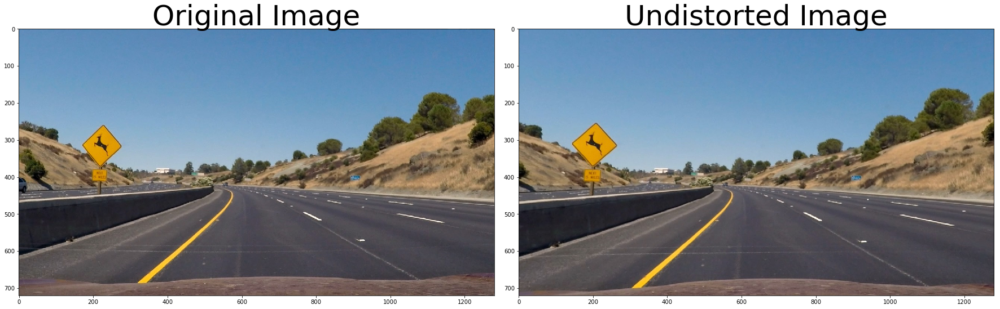

test3


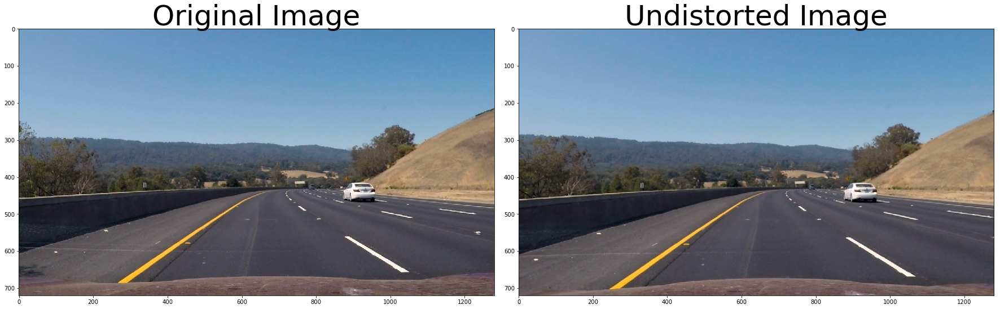

test4


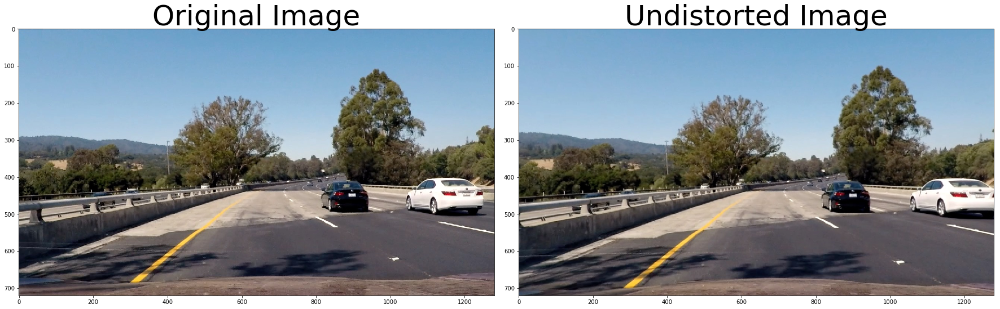

test5


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


test6


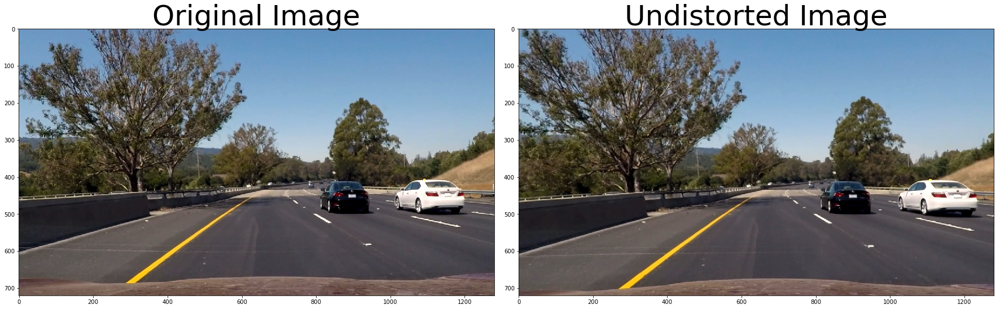

In [5]:
# Undistort test images
for fpath in test_image_paths:
    fname = fpath.split('\\')[-1].split('.')[0]
    print(fname)
    img = cv2.imread(fpath)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    cv2.imwrite('../output_images/undistored_' + fname + '.jpg', undistorted)

In [6]:
undistorted_test_image_paths = []
undistorted_test_image_paths.extend(glob.glob('../output_images/undistored_*.jpg'))
# undistorted_test_image_paths.append("../test_images/project_video.jpg")

** Define region of interest (RoI) **

undistored_straight_lines1


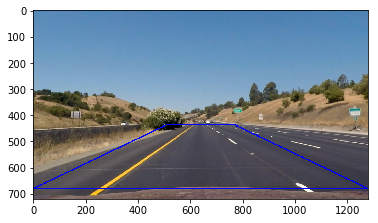

In [7]:
def draw_RoI(image, RoI_vertices, thickness=3):
    
    left_bottom_point = tuple(RoI_vertices[0, 0])
    left_top_point = tuple(RoI_vertices[0, 1])
    right_top_point = tuple(RoI_vertices[0, 2])
    right_bottom_point = tuple(RoI_vertices[0, 3])
    
    color = (0, 0, 255)
    
    cv2.line(image, left_bottom_point, left_top_point, color, thickness)
    cv2.line(image, left_top_point, right_top_point, color, thickness)
    cv2.line(image, right_top_point, right_bottom_point, color, thickness)
    cv2.line(image, left_bottom_point, right_bottom_point, color, thickness)
    
    return image

def get_RoI_vertices(image):
    # Define a convex polygon mask for the Region of Interest
    imshape = image.shape
    
    left_bottom_point = [np.round(0.00 * imshape[1]).astype(int), np.round(0.97 * imshape[0]).astype(int)]
    left_top_point = [np.round(0.4*imshape[1]).astype(int), np.round((0.63)*imshape[0]).astype(int)]
    right_top_point = [np.round(0.6*imshape[1]).astype(int), np.round((0.63)*imshape[0]).astype(int)]
    right_bottom_point = [np.round(1.00 * imshape[1]).astype(int), np.round(0.97 * imshape[0]).astype(int)]
    
    horizontal_shift = 0.0#np.round(0.02 * imshape[1]).astype(int) #0.02
    left_bottom_point[0] += horizontal_shift
    left_top_point[0] += horizontal_shift
    right_top_point[0] += horizontal_shift
    right_bottom_point[0] += horizontal_shift
    
    vertical_shift = -1 * np.round(0.025 * imshape[0]).astype(int)
    left_bottom_point[1] += vertical_shift
    left_top_point[1] += vertical_shift
    right_top_point[1] += vertical_shift
    right_bottom_point[1] += vertical_shift    
    
    #Convert to tuple
    left_bottom_point = tuple(left_bottom_point)
    left_top_point = tuple(left_top_point)
    right_top_point = tuple(right_top_point)
    right_bottom_point = tuple(right_bottom_point)
    
    return np.array([[left_bottom_point, left_top_point, right_top_point, right_bottom_point]], dtype=np.int32)

def apply_Region_of_Interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

fpath = undistorted_test_image_paths[0]
fname = fpath.split('\\')[-1].split('.')[0]
print(fname)
img = cv2.imread(fpath)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
RoI_vertices = get_RoI_vertices(img)
img = draw_RoI(img, RoI_vertices)
plt.imshow(img)
plt.show()


In [8]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure

undistored_straight_lines1


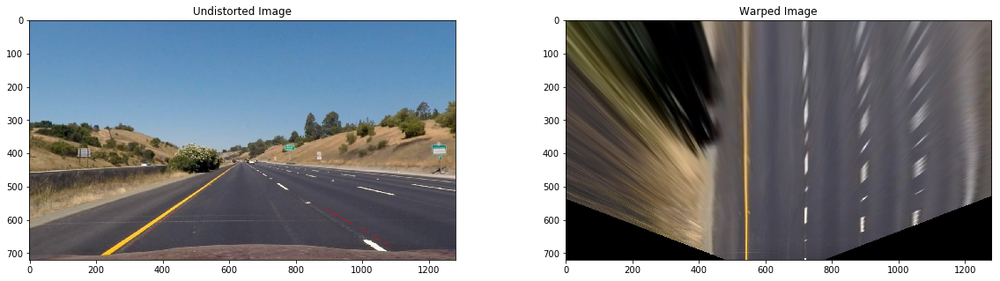

undistored_straight_lines2


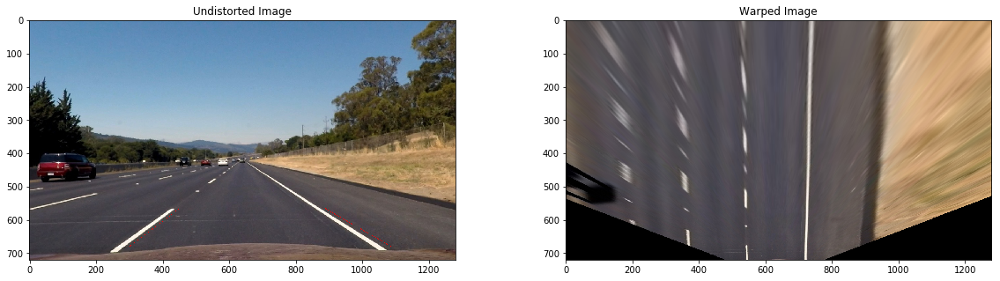

undistored_test1


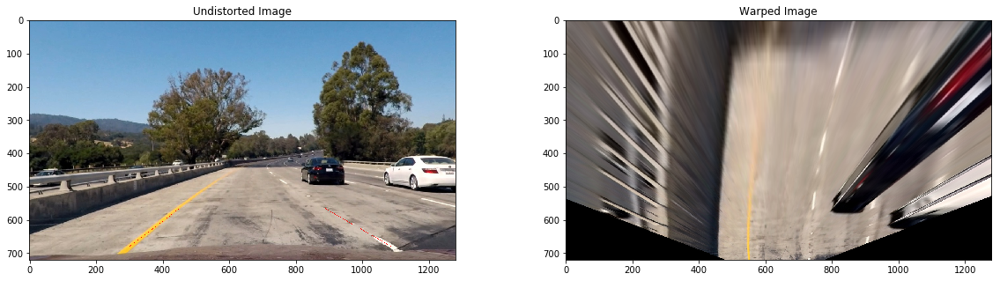

undistored_test2


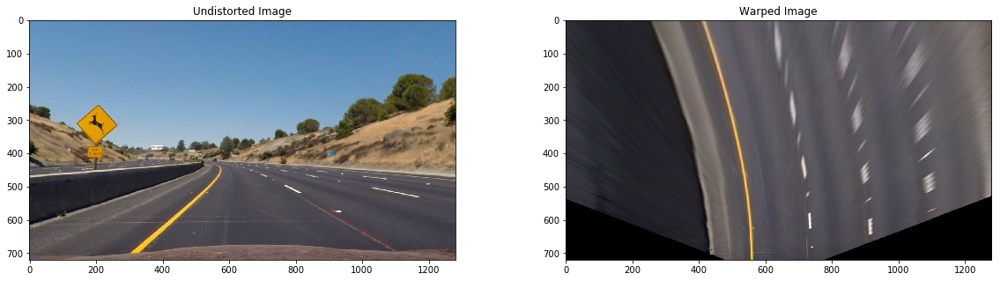

undistored_test3


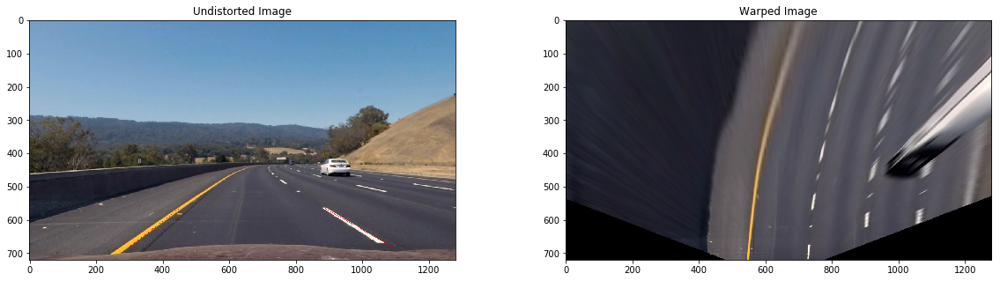

undistored_test4


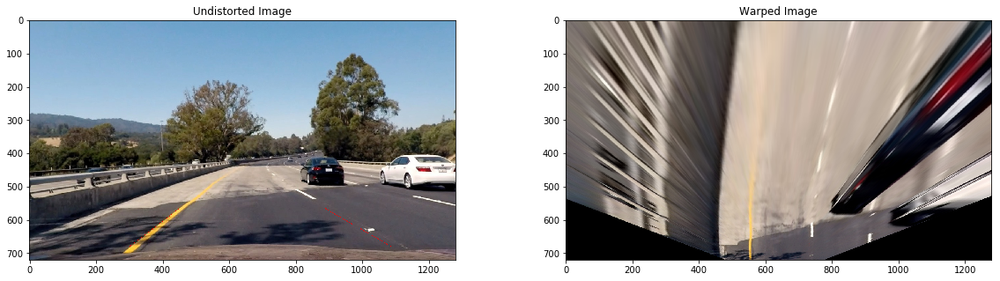

undistored_test5


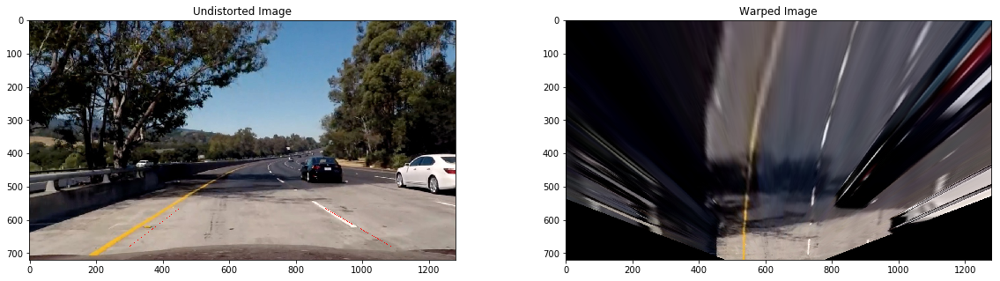

undistored_test6


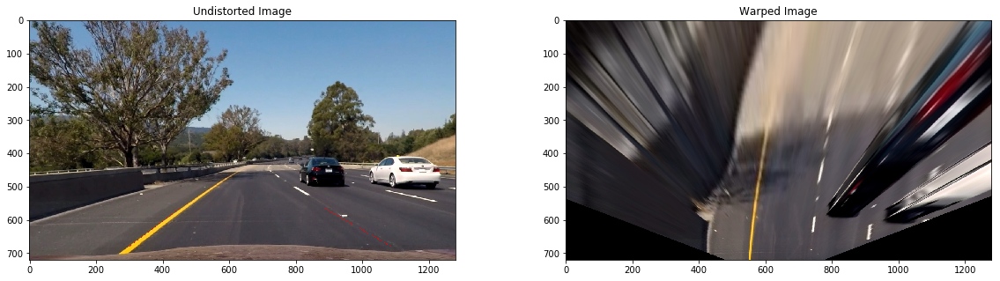

In [9]:
def get_PerspectiveTrans_vertices(image):
    # Define a convex polygon mask for the Region of Interest
    imshape = image.shape
    
    left_bottom_point = [np.round(0.23 * imshape[1]).astype(int), np.round(0.97 * imshape[0]).astype(int)]
    left_top_point = [np.round(0.355*imshape[1]).astype(int), np.round((0.8)*imshape[0]).astype(int)]
    right_top_point = [np.round(0.68*imshape[1]).astype(int), np.round((0.8)*imshape[0]).astype(int)]
    right_bottom_point = [np.round(0.845 * imshape[1]).astype(int), np.round(0.97 * imshape[0]).astype(int)]
    
    horizontal_shift = np.round(0.005 * imshape[1]).astype(int) #0.02
    left_bottom_point[0] += horizontal_shift
    left_top_point[0] += horizontal_shift
    right_top_point[0] += horizontal_shift
    right_bottom_point[0] += horizontal_shift
    
    vertical_shift =-1 * np.round(0.025 * imshape[0]).astype(int)
    left_bottom_point[1] += vertical_shift
    left_top_point[1] += vertical_shift
    right_top_point[1] += vertical_shift
    right_bottom_point[1] += vertical_shift    
    
    #Convert to tuple
    left_bottom_point = tuple(left_bottom_point)
    left_top_point = tuple(left_top_point)
    right_top_point = tuple(right_top_point)
    right_bottom_point = tuple(right_bottom_point)
    
    return np.array([[left_top_point, right_top_point, right_bottom_point, left_bottom_point]], dtype=np.int32)

def Perspective_transform():
    warped_imgs = []
    undist_imgs = []
    
    for fpath in undistorted_test_image_paths:
        fname = fpath.split("\\")[-1].split(".")[0]
        print(fname)
        plt.close('all')
        undist = cv2.imread(fpath)
        undist_imgs.append(undist)
        img_size = undist.shape[0:2][::-1]
        
        PerspectiveTrans_vertices = get_PerspectiveTrans_vertices(undist)

        horizontal_offset = 550
        vertical_offset = 670
        src = np.float32(PerspectiveTrans_vertices)
        dst = np.float32([[horizontal_offset, vertical_offset], [img_size[0] - horizontal_offset, vertical_offset],
                          [img_size[0] - horizontal_offset, img_size[1]], [horizontal_offset, img_size[1]]])
        
        M = cv2.getPerspectiveTransform(src, dst)
        
        undist = draw_RoI(undist, PerspectiveTrans_vertices, thickness=1)

        warped = cv2.warpPerspective(undist, M, img_size)
        
        warped_imgs.append(warped)
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
        ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax1.set_title("Undistorted Image")
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax2.set_title("Warped Image")
        plt.savefig('../output_images/' + fname + '_persT')
        plt.show()
        
    return warped_imgs, undist_imgs
        

warped_imgs, undist_imgs = Perspective_transform()

undistored_straight_lines1


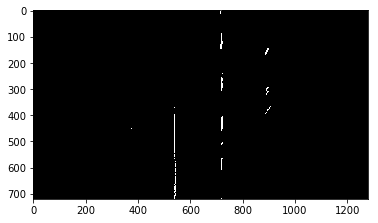

undistored_straight_lines2


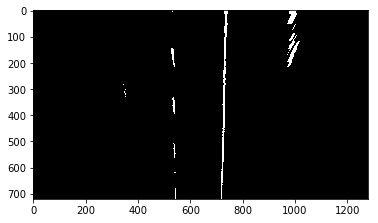

undistored_test1


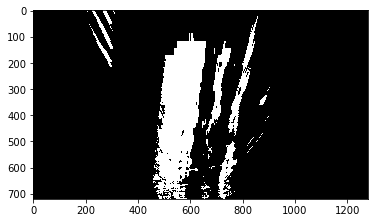

undistored_test2


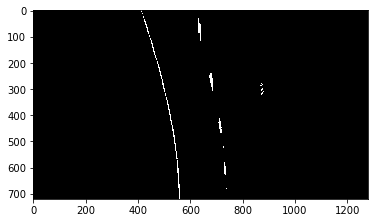

undistored_test3


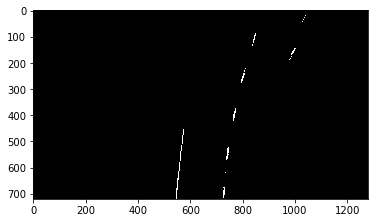

undistored_test4


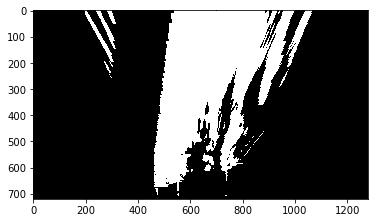

undistored_test5


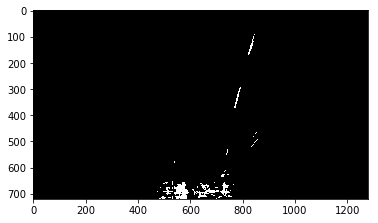

undistored_test6


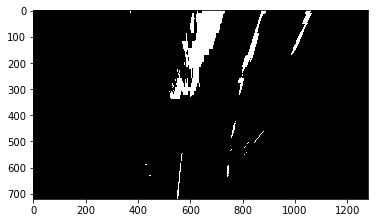

In [10]:
def apply_color_threshold(img, color_space_conversion, color_thres):
    C012 = cv2.cvtColor(img, color_space_conversion)

    C0 = C012[:, :, 0]
    C1 = C012[:, :, 1]
    C2 = C012[:, :, 2]

    C0_binary_output = np.zeros_like(C0)
    C1_binary_output = np.zeros_like(C1)
    C2_binary_output = np.zeros_like(C2)

    C0_binary_output[(C0 > color_thres[0][0]) & (C0 < color_thres[0][1])] = 1
    C1_binary_output[(C1 > color_thres[1][0]) & (C1 < color_thres[1][1])] = 1
    C2_binary_output[(C2 > color_thres[2][0]) & (C2 < color_thres[2][1])] = 1

    return C0_binary_output, C1_binary_output, C2_binary_output


def color_threshold(image, RoI_vertices):

    # Apply color space thresold
    LAB_space = cv2.COLOR_RGB2LAB
    LAB_thres = [[180, 255], [0, 255], [150, 255]]  # lower and upper bounds for L, A and B channel
    L_binary_output, A_binary_output, B_binary_output = apply_color_threshold(image, LAB_space, LAB_thres)

    # Apply region of interest
    L_binary_output = apply_Region_of_Interest(L_binary_output, RoI_vertices)
    B_binary_output = apply_Region_of_Interest(B_binary_output, RoI_vertices)

    # Combine L and B binary output as final output
    bin_output = np.zeros_like(L_binary_output)
    bin_output[(L_binary_output >= 1) | (B_binary_output >= 1)] = 1

    #plt.show(bin_output)
        
    return bin_output

warped_imgs = []

for fpath in undistorted_test_image_paths:
    fname = fpath.split("\\")[-1].split(".")[0]
    print(fname)
    undist = cv2.imread(fpath)
    img_size = undist.shape[0:2][::-1]
    
    RoI_vertices = get_RoI_vertices(undist)
    bin_output = color_threshold(undist, RoI_vertices)
    
    PerspectiveTrans_vertices = get_PerspectiveTrans_vertices(bin_output)

    horizontal_offset = 550
    vertical_offset = 670
    src = np.float32(PerspectiveTrans_vertices)
    dst = np.float32([[horizontal_offset, vertical_offset], [img_size[0] - horizontal_offset, vertical_offset],
                      [img_size[0] - horizontal_offset, img_size[1]], [horizontal_offset, img_size[1]]])

    M = cv2.getPerspectiveTransform(src, dst)

    # bin_output = draw_RoI(bin_output, PerspectiveTrans_vertices, thickness=1)

    warped = cv2.warpPerspective(bin_output, M, img_size)

    #warped = np.array(cv2.merge((warped*255,warped*255,warped*255)), dtype=np.uint8)

    warped_imgs.append(warped)
    plt.imshow(warped, cmap='gray')
    plt.show()

    
 



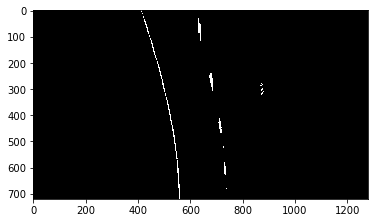

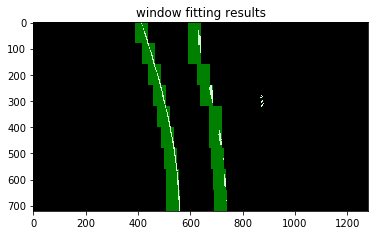

In [11]:
def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane 
    # by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))

        # Only update window center position when window not empty
        if np.max(conv_signal[l_min_index:l_max_index]) != 0:
            l_center = np.argmax(conv_signal[l_min_index:l_max_index]) + l_min_index - offset
        if np.max(conv_signal[r_min_index:r_max_index]) != 0:
            r_center = np.argmax(conv_signal[r_min_index:r_max_index]) + r_min_index - offset
            
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

undist = undist_imgs[3]
warped = warped_imgs[3]
plt.imshow(warped, cmap='gray')
plt.show()

window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    l_points_s = np.zeros_like(warped)
    r_points_s = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_mask == 1) & (warped == 1)] = 255
        r_points[(r_mask == 1) & (warped == 1)] = 255
        
        l_points_s[(l_mask == 1) | (warped == 1)] = 255
        r_points_s[(r_mask == 1) | (warped == 1)] = 255

    # Draw the results
    template = np.array(r_points_s+l_points_s,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channle 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped*255,warped*255,warped*255)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 0.8, template, 0.5, 0.0) # overlay the orignal road image with window results
    
    # If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
# ax1.imshow(l_points, cmap='gray')
# ax1.set_title('l_points')
# ax2.imshow(r_points, cmap='gray')
# ax2.set_title('r_points')
# plt.show()

3011.05813989 7366.73916022


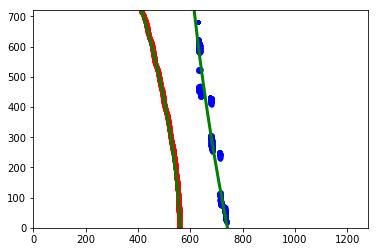

In [12]:
ploty = np.linspace(0, 719, num=720).astype(np.uint)
leftx = np.argwhere(l_points == 255)[:,1]
lefty = np.argwhere(l_points == 255)[:,0]
rightx = np.argwhere(r_points == 255)[:,1]
righty = np.argwhere(r_points == 255)[:,0]

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(lefty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(righty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, lefty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, righty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
#plt.gca().invert_yaxis() # to visualize as we do the images

y_eval = np.maximum(np.max(lefty), np.max(righty))
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

**Unwarp left lane and right lane**

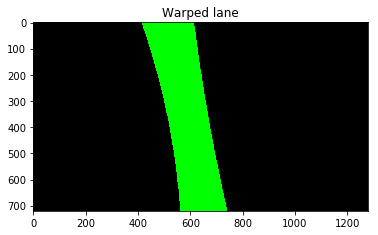

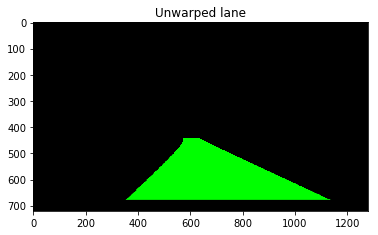

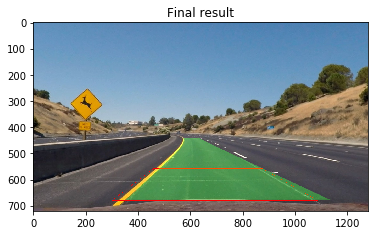

In [13]:
leftx = leftx[::-1]  # Reverse
rightx = rightx[::-1]  # Reverse
ploty = ploty[::-1] # Reverse

# unwarped
Minv = cv2.getPerspectiveTransform(dst, src)

# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted.shape[1], undistorted.shape[0])) 

plt.title("Warped lane")
plt.imshow(color_warp)
plt.show()

plt.imshow(newwarp)
plt.title("Unwarped lane")
plt.show()

undist = cv2.cvtColor(undist, cv2.COLOR_BGR2RGB)
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

plt.imshow(result)
plt.title("Final result")
plt.show()

In [ ]:
def image_process_pipeline(image):
    # Input BGR

    # Image undistortion
    global objpoints
    global imgpoints
    RoI_vertices = get_RoI_vertices(image)
    
    undistorted = cal_undistort(image, objpoints, imgpoints)
    
    # Color space 
    LAB_thres = [[210, 255], [0, 255], [150, 255]]
    LAB = cv2.cvtColor(undistorted, cv2.COLOR_RGB2LAB)
    
    L = LAB[:,:,0]
    B = LAB[:,:,2]
    
    L_binary_output = np.zeros_like(L)
    B_binary_output = np.zeros_like(B)
    
    L_binary_output[(B > LAB_thres[2][0]) & (B < LAB_thres[2][1])] = 1
    B_binary_output[(L > LAB_thres[0][0]) & (L < LAB_thres[0][1])] = 1
    
    L_binary_output = region_of_interest(L_binary_output, RoI_vertices)
    B_binary_output = region_of_interest(B_binary_output, RoI_vertices)
    
    #return np.array(cv2.merge((B_binary_output*255,B_binary_output*255,L_binary_output*255)),np.uint8)
    
    bin_output = np.zeros_like(L)
    bin_output[(L_binary_output == 1) | (B_binary_output == 1)] = 1
    
    # Warped
    img_size = undistorted.shape[0:2][::-1]
    # max 685
    vertical_offset = 670
    horizontal_offset = 500
    PerspectiveTrans_vertices = get_PerspectiveTrans_vertices(undistorted)


#         src = np.float32([[595, 450],[687, 450],
#                           [1069, 690],[237, 690]])
#         src = np.float32([[540, 489],[749, 489],
#                           [870, 567],[430, 567]])
    src = np.float32(PerspectiveTrans_vertices)
    dst = np.float32([[horizontal_offset, vertical_offset], [img_size[0]-horizontal_offset, vertical_offset], 
                      [img_size[0]-horizontal_offset, img_size[1]], [horizontal_offset, img_size[1]]])

    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(bin_output, M, img_size)
    
    #return np.array(cv2.merge((warped*255,warped*255,warped*255)),np.uint8)

    # find window centroids
    window_width = 50 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching

    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    # If we found any window centers
    if len(window_centroids) > 0:

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_mask == 1) & (warped == 1)] = 255
            r_points[(r_mask == 1) & (warped == 1)] = 255
            
    ploty = np.linspace(0, 719, num=720).astype(np.uint)

    leftx = np.argwhere(l_points == 255)[:,1]
    lefty = np.argwhere(l_points == 255)[:,0]
    rightx = np.argwhere(r_points == 255)[:,1]
    righty = np.argwhere(r_points == 255)[:,0]
    
#     for x, y in zip(leftx, lefty):
#         cv2.circle(undistorted, (x, y), 1, (255,0,0))
        
#     for x, y in zip(rightx, righty):
#         cv2.circle(undistorted, (x, y), 1, (0,0,255))

    # leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    # rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    for x, y in zip(left_fitx, ploty):
        cv2.circle(undistorted, (np.int_(x), y), 1, (255,0,0))
        
    for x, y in zip(right_fitx, ploty):
        cv2.circle(undistorted, (np.int_(x), y), 1, (0,0,255))

    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # unwarped
    Minv = np.linalg.inv(M)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted.shape[1], undistorted.shape[0])) 
    # Combine the result with the original image
    undistorted = draw_RoI(undistorted, RoI_vertices)
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    
    image = result
    
    return image


img = cv2.imread("../test_images/test1.jpg") #project_video2.jpg
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = image_process_pipeline(img)
plt.imshow(img, cmap='gray')
#plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
# output1 = '1_test.mp4'
# clip1 = VideoFileClip('1.mp4')
# output_clip1 = clip1.fl_image(image_process_pipeline)
# %time output_clip1.write_videofile(output1, audio=False)

output1 = 'project_video_test.mp4'
clip1 = VideoFileClip('../project_video.mp4')
output_clip1 = clip1.fl_image(image_process_pipeline)
%time output_clip1.write_videofile(output1, audio=False)

In [ ]:
output2 = 'harder_challenge_test.mp4'
clip2 = VideoFileClip('../harder_challenge_video.mp4')
output_clip2 = clip2.fl_image(image_process_pipeline)
%time output_clip2.write_videofile(output2, audio=False)

output3 = 'challenge_video_test.mp4'
clip3 = VideoFileClip('../challenge_video.mp4')
output_clip3 = clip3.fl_image(image_process_pipeline)
%time output_clip3.write_videofile(output3, audio=False)